# Visualize monthly changes in Hirakund reservoir using video

This Notebook has been adapted from an training authored by Esri, found [here](https://github.com/Esri/arcgis-python-api/blob/master/samples/04_gis_analysts_data_scientists/visualize_monthly_changes_in_hirakund_reservoir_using_video.ipynb) and offered under Apache License ([2.0](https://github.com/Esri/arcgis-python-api/blob/master/LICENSE)).

[Copy of original license](https://github.com/Esri/arcgis-python-api/blob/master/LICENSE)

Original Copywrite Notice:

> ## Licensing
> Copyright 2018-2022 Esri
> 
> Licensed under the Apache License, Version 2.0 (the "License");
> you may not use this file except in compliance with the License.
> You may obtain a copy of the License at
> 
>    http://www.apache.org/licenses/LICENSE-2.0
> 
> Unless required by applicable law or agreed to in writing, software
> distributed under the License is distributed on an "AS IS" BASIS,
> WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
> See the License for the specific language governing permissions and
> limitations under the License.
> 
> A copy of the license is available in the repository's [license.txt](https://github.com/Esri/arcgis-python-api/blob/master/license.txt) file.

Significant changes made by NCAR: 

1. Changed the method for detecting and installing libraries (pillow, imageio).
2. Connecting to the 'home' environment instead of the Esri sandbox.
3. Changes to `collection` and `create_movie` functions to accept an output directory
4. Displaying the resulting GIF using IPython display Image function instead of hard-coded.
5. Set the extent of the desired image using India CWC reservoir polygon data.

## Table of Contents
* [Introduction](#Introduction)
* [Necessary Imports](#Necessary-Imports)
* [Connect to your GIS](#Connect-to-your-GIS)
* [Get the data for analysis](#Get-the-data-for-analysis)
* [Function to create collection of images with desired time intervals](#Function-to-create-collection-of-images-with-desired-time-intervals)
* [Make video from image collection](#Make-video-from-image-collection)
* [Conclusion](#Conclusion)

## Introduction

The World is changing daily. Major changes like shrinking of lakes, river path shifts, construction of megastructures can be seen directly from the satellite images. This notebook creates a movie to visualize monthly changes in Hirakund reservoir, Odisha.

First, let's import all the necessary libraries and connect to our GIS via an existing profile, e.g. ```gis = GIS("Pro")```

## Necessary Imports

In [202]:
# Find the directory of the current project and add to PATH
import sys, os, arcpy
home_folder = arcpy.mp.ArcGISProject("current").homeFolder
sys.path.insert(0, home_folder)
os.chdir(home_folder)

# The 00_environment_setup notebook contains libraries and other things common to all the notebooks (e.g. file paths)
%run "00_environment_setup.ipynb"

# Additional libraries
from platform import system
from arcgis.raster.functions import apply

# Because we will later import Image from PIL, we need to import IPython.display.Image as something else
from IPython.display import Image as dImage

Active Portal in ArcGIS Pro
Logged in as ksampson
Current conda environment:
	arcgispro-py3-clone C:\Users\ksampson\AppData\Local\ESRI\conda\envs\arcgispro-py3-clone
Found input data directory: C:\Users\ksampson\Documents\GitHub\GloFAS_Q2Q_Bias_Correction_and_Verification\data\input
Completed importing and/or installing libraries in 4.65 seconds.


**Note**: to run this sample, you need a few extra libraries in your conda environment. If you don't have the libraries, install them by running the following commands from cmd.exe or your shell

```
conda install -c anaconda pillow
conda install -c conda-forge imageio
```

In [203]:
try:
    from PIL import Image, ImageFont, ImageDraw
except ImportError:
    print('Could not import pillow library. Installing using conda.')
    #!conda install -c anaconda pillow -y
    !conda install --freeze-installed esri::numpy=1.20.* anaconda::pillow -y
    from PIL import Image, ImageFont, ImageDraw
    
try:
    import imageio
except ImportError:
    print('Could not import imageio library. Installing using conda.')
    #!conda install -c conda-forge imageio -y
    !conda install --freeze-installed esri::numpy=1.20.* conda-forge::imageio -y
    import imageio

Could not import imageio library. Installing using conda.
Solving environment: ...working... done
﻿
## Package Plan ##
﻿
  environment location: C:\Users\ksampson\AppData\Local\ESRI\conda\envs\arcgispro-py3-clone
﻿
  added / updated specs:
    - imageio
﻿
﻿
The following packages will be downloaded:
﻿
    package                    |            build
    ---------------------------|-----------------
    blas-1.0                   |              mkl           1 KB  conda-forge
    cffi-1.16.0                |   py39ha55989b_0         231 KB  conda-forge
    cryptography-41.0.4        |   py39hb6bd5e6_0         1.0 MB  conda-forge
    freetype-2.12.1            |       hdaf720e_2         498 KB  conda-forge
    imageio-2.31.5             |     pyh8c1a49c_0         284 KB  conda-forge
    libsqlite-3.43.2           |       hcfcfb64_0         827 KB  conda-forge
    m2w64-gcc-libgfortran-5.3.0|                6         342 KB  conda-forge
    m2w64-gcc-libs-5.3.0       |                7  

## Get the data for analysis

Search for Multispectral Landsat layer in ArcGIS Online.

<Item title:"Multispectral Landsat" type:Imagery Layer owner:esri>
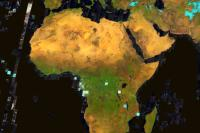

In [204]:
landsat_item = gis.content.get('d9b466d6a9e647ce8d1dd5fe12eb434b')
landsat = landsat_item.layers[0]
landsat_item

Applying Natural color to the filtered Landsat collection using predefined `apply` function

### Select the area of interest

<Item title:"India: National Register of Large Dams 2019 (Polygon)" type:Feature Layer Collection owner:esri_IN_content>
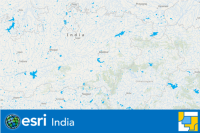

In [205]:
# India Reservoirs in Living Atlas
CWC_Reservoirs = "34b71f5ea24b49ce857e8ee5e71a4117"
item = gis.content.get(CWC_Reservoirs)
item

In [216]:
%%time

dam_layer = item.layers[0]
dam_layer_filter = dam_layer.query(where="name = 'K.R.Sagara Dam'", as_df=True)
extent = dam_layer_filter.iloc[0]['SHAPE'].extent
extent = {'xmin': extent[0], 'ymin': extent[1], 'xmax': extent[2], 'ymax': extent[3]}
print(extent)

m = gis.map('Mysuru, India')
m.add_layer(dam_layer_filter, options={'opacity':0.1})
m.basemap = 'satellite'
m

{'xmin': 8505585.607700001, 'ymin': 1390822.4349999987, 'xmax': 8524908.163600001, 'ymax': 1408422.3772}
Wall time: 2.18 s


MapView(layout=Layout(height='400px', width='100%'))

In [207]:
rgb_collection = apply(landsat, 'Natural Color with DRA')

## Function to create collection of images with desired time intervals

The function below creates an array of images with the desired time intervals. If a user specifies 'm' then the images in the selected collection will be consolidated on a monthly basis i.e. all the images of the specified extent will be mosaicked monthly and if the user specifies 'y' as the interval then the images in the selected collection will be consolidated on yearly basis.

In [217]:
from functools import lru_cache

@lru_cache(maxsize=50)
def load_font():
    try:
        if system()=='Windows':
            return ImageFont.truetype("arial.ttf", 30)
        elif system()=='Linux':
            return ImageFont.truetype("~/.fonts/truetype/dejavu/DejaVuSans.ttf", 30)
        else:
            return ImageFont.truetype("Arial.ttf", 30)
    except:
        return ImageFont.load_default()

In [218]:
def collection(df, out_dir, interval, start, end, height, width):
    images=[]
    if(interval=='m'):                                                                                     # monthly
        for i in range(int(start.split('-')[0]), int(end.split('-')[0])+1):
            for j in range(1,13):
                selected = df[(df['AcquisitionDate'].dt.year == i) & (df['AcquisitionDate'].dt.month == j)]
                id = selected['OBJECTID'].values.tolist()
                if(len(id)>0):
                    rgb_collection.mosaic_by(method="LockRaster",lock_rasters=id)
                    img_name = 'img_'+str(i)+"-"+str(j)+".jpg"
                    img_file = os.path.join(out_dir, img_name)
                    rgb_collection.export_image(bbox=extent, size=[height,width], f='image', 
                                                  save_folder=out_dir, 
                                                  save_file=img_name)
                    img = Image.open(img_file).convert('RGB')
                    font = load_font()
                    draw = ImageDraw.Draw(img)
                    draw.text((500, 0),'{:>2}-{:<4}'.format(j,i),(255,255,255),font=font)
                    images.append(img)
                    os.remove(img_file)
                    
    elif(interval=='y'):                                                                                  # yearly
        for i in range(int(start.split('-')[0]), int(end.split('-')[0])+1):
            selected = df[df['AcquisitionDate'].dt.year == i]
            id = selected['OBJECTID'].values.tolist()
            if(len(id)>0):
                rgb_collection.mosaic_by(method="LockRaster",lock_rasters=id)
                img_name = 'img_'+str(i)+".jpg"
                img_file = os.path.join(out_dir, img_name)
                rgb_collection.export_image(bbox=extent, size=[height,width], f='image', 
                                              save_folder=out_dir, 
                                              save_file=img_name)
                img = Image.open(img_file).convert('RGB')
                font = load_font()
                draw = ImageDraw.Draw(img)
                draw.text((500, 0),'{:>4}'.format(i),(255,255,255),font=font)  
                images.append(img)
                os.remove(img_file)
    
    return images

## Make video from image collection

The function below will generate a movie (gif) from the collection saved from the above step.

In [219]:
def create_movie(target, out_dir, interval, start, end, height, width, extent, duration):
    start_date = datetime.strptime(start, '%Y-%m-%d')
    end_date = datetime.strptime(end, '%Y-%m-%d')
    selected = target.filter_by(where="(Category = 1) AND (CloudCover <=0.5)",
                             time=[start_date, end_date],
                             geometry=arcgis.geometry.filters.intersects(extent))
    df = selected.query(out_fields="AcquisitionDate, GroupName, CloudCover, DayOfYear", 
                        order_by_fields="AcquisitionDate").sdf
    df['OBJECTID'] = df['OBJECTID'].astype(int)
    df['AcquisitionDate'] = pd.to_datetime(df['AcquisitionDate'], unit='ms')
    frames = collection(df, out_dir, interval, start, end, height, width)
    out_gif = os.path.join(out_dir, 'movie_'+interval+'.gif')
    imageio.mimsave(out_gif, frames, format='GIF', loop=0, duration=duration)
    print("Movie Created")
    return out_gif

In [222]:
%%time

# calling create_movie function for the year 2022 on a monthly basis
#out_gif = create_movie(rgb_collection, output_data_dir, 'm' ,'2022-01-01','2022-12-31', 1000, 1000, extent, 1.0) 

# Call the create_movie function for 1980-2023 for annual interval
out_gif = create_movie(rgb_collection, output_data_dir, 'y' ,'1980-01-01','2023-10-01', 1000, 1000, extent, 1.0)

Movie Created
Wall time: 1min 50s


The movie (gif) will be created in the `out_dir` directory specified in the `create_movie` call. The gif below is generated using the code above which shows how the Hirakund reservoir in Odisha, India changed monthly in the year 2019.

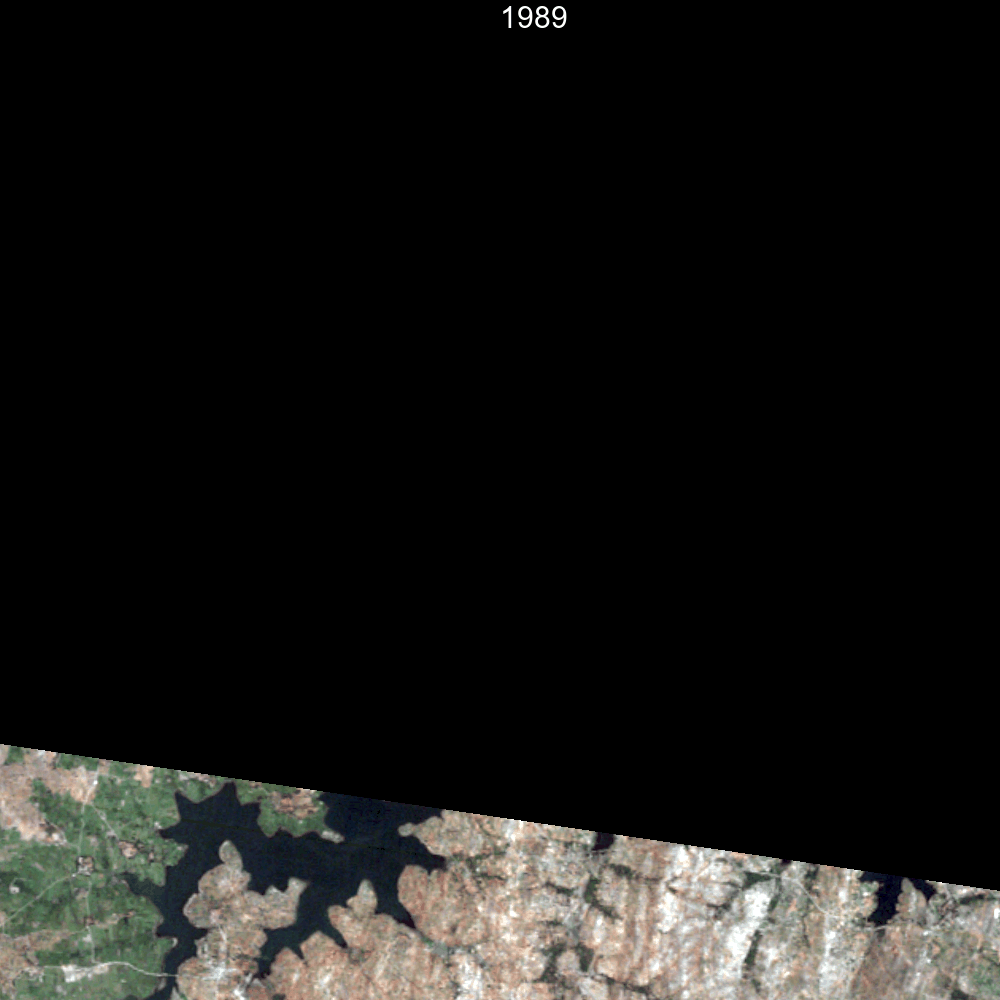

In [223]:
display(dImage(data=open(out_gif,'rb').read(), format='png'))

## Conclusion

The sample notebook shows how you can animate an Imagery Layer over time to get a visual detail of the change that has happened on any given extent, either monthly or annually. You can bring any image collection that you have or use the image service provided by Esri Living Atlas and run this notebook against it. This can be repeated for any other location and for any other time interval by changing the `extent` variable and the `time` interval when calling the `create_movie()` function.

### Reset the namespace

The following `%reset -f` command is a built-in command in Jupyter Notebook that will reset the namespace. This is good practice to run when you are finished with the notebook.

In [ ]:
%reset -f